In [1]:
pip install gdown --upgrade


In [2]:
!gdown --folder 'https://drive.google.com/drive/folders/1wkKjgArbXhzsxjIq-fa8b-SI1pq6oDHF'


Retrieving folder contents
Processing file 1yo1NSZOFDj7VGkdy_kCOGQBcfEoAPOSS ninjacart_data.zip
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From (original): https://drive.google.com/uc?id=1yo1NSZOFDj7VGkdy_kCOGQBcfEoAPOSS
From (redirected): https://drive.google.com/uc?id=1yo1NSZOFDj7VGkdy_kCOGQBcfEoAPOSS&confirm=t&uuid=7ee24b55-3258-4410-a8e3-caedd64e8c2a
To: /content/ninja/ninjacart_data.zip
100% 275M/275M [00:05<00:00, 54.1MB/s]
Download completed


In [3]:
!unzip /content/ninja/ninjacart_data.zip


Archive:  /content/ninja/ninjacart_data.zip
   creating: ninjacart_data/test/
   creating: ninjacart_data/test/indian market/
  inflating: ninjacart_data/test/indian market/bhl.jpeg  
  inflating: ninjacart_data/test/indian market/bhv.jpeg  
  inflating: ninjacart_data/test/indian market/bn.jpeg  
  inflating: ninjacart_data/test/indian market/hjx.jpeg  
  inflating: ninjacart_data/test/indian market/igis.jpeg  
  inflating: ninjacart_data/test/indian market/in.jpeg  
  inflating: ninjacart_data/test/indian market/india-4898453__340.jpg  
  inflating: ninjacart_data/test/indian market/indianmarket10.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket12.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket13.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket14.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket15.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket18.jpeg  
  inflating: ninjacart_data/test/indian m

In [4]:
# Import common libraries
import os
import glob
import random
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Import tensorflow and its modules
import tensorflow as tf
from tensorflow import keras # this allows <keras.> instead of <tf.keras.>
from tensorflow.keras import layers # this allows <layers.> instead of <tf.keras.layers.>
tf.keras.utils.set_random_seed(111) # set random seed

# To supress any warnings during the flow
import warnings
warnings.filterwarnings('ignore')

In [5]:
class_dirs = os.listdir("/content/ninjacart_data/train") # list all directories inside "train" folder
image_dict = {} # dict to store image array(key) for every class(value)
count_dict = {} # dict to store count of files(key) for every class(value)
# iterate over all class_dirs
for cls in class_dirs:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'/content/ninjacart_data/train/{cls}/*')
    # count number of files in each class and add it to count_dict
    count_dict[cls] = len(file_paths)
    # select random item from list of image paths
    image_path = random.choice(file_paths)
    # load image using keras utility function and save it in image_dict
    image_dict[cls] = tf.keras.utils.load_img(image_path)

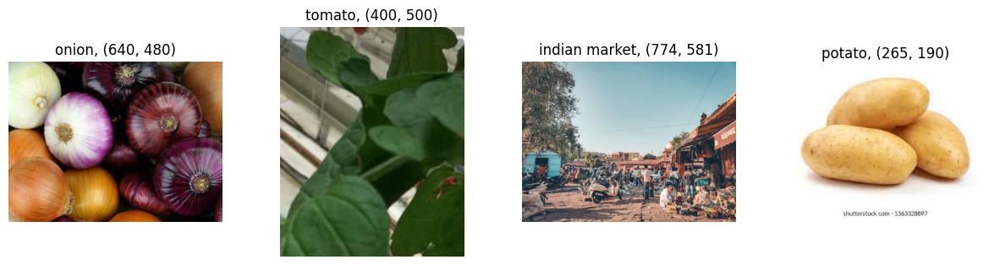

In [6]:
## Viz Random Sample from each class

plt.figure(figsize=(15, 12))
# iterate over dictionary items (class label, image array)
for i, (cls,img) in enumerate(image_dict.items()):
    # create a subplot axis
    ax = plt.subplot(3, 4, i + 1)
    # plot each image
    plt.imshow(img)
    # set "class name" along with "image size" as title
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

Count of training samples per class:
            class  count
0          onion    849
1         tomato    789
2  indian market    599
3         potato    898


<Axes: title={'center': 'Training Data Count per class'}, xlabel='class'>

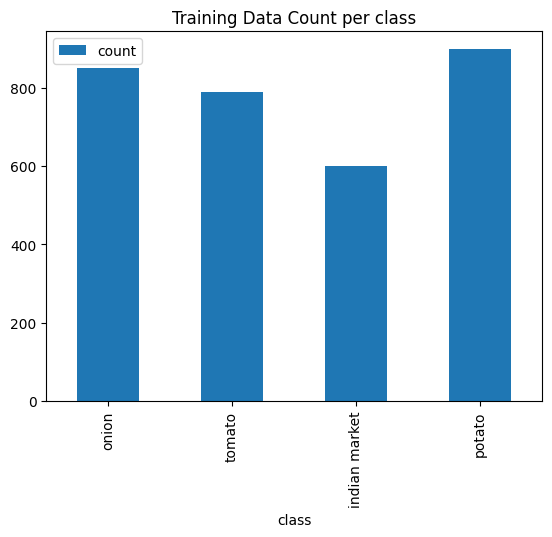

In [7]:
## Let's now Plot the Data Distribution of Training Data across Classes
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})
print("Count of training samples per class:\n", df_count_train)

# draw a bar plot using pandas in-built plotting function
df_count_train.plot.bar(x='class', y='count', title="Training Data Count per class")

In [8]:
class_dirs = os.listdir("/content/ninjacart_data/test") # list all directories inside "train" folder
image_dict = {} # dict to store image array(key) for every class(value)
count_dict = {} # dict to store count of files(key) for every class(value)
# iterate over all class_dirs
for cls in class_dirs:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'/content/ninjacart_data/test/{cls}/*')
    # count number of files in each class and add it to count_dict
    count_dict[cls] = len(file_paths)
    # select random item from list of image paths
    image_path = random.choice(file_paths)
    # load image using keras utility function and save it in image_dict
    image_dict[cls] = tf.keras.utils.load_img(image_path)

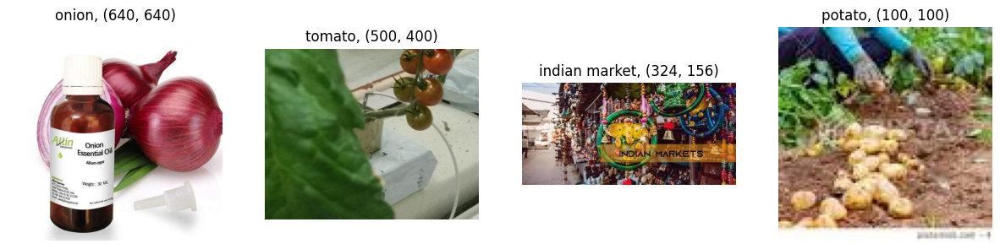

In [9]:
## Viz Random Sample from each class

plt.figure(figsize=(15, 12))
# iterate over dictionary items (class label, image array)
for i, (cls,img) in enumerate(image_dict.items()):
    # create a subplot axis
    ax = plt.subplot(3, 4, i + 1)
    # plot each image
    plt.imshow(img)
    # set "class name" along with "image size" as title
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

Count of training samples per class:
            class  count
0          onion     83
1         tomato    106
2  indian market     81
3         potato     81


<Axes: title={'center': 'Training Data Count per class'}, xlabel='class'>

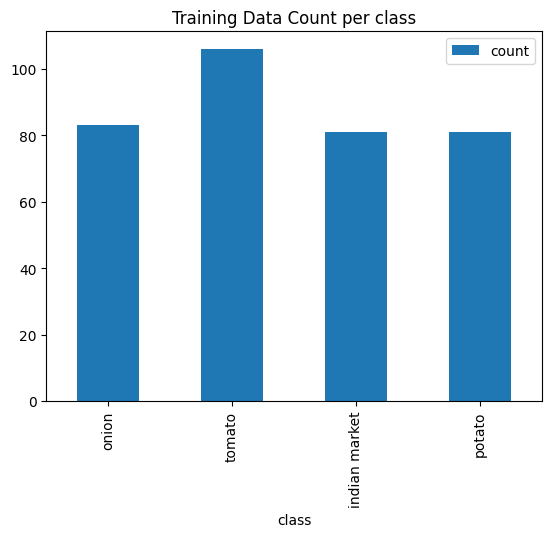

In [10]:
## Let's now Plot the Data Distribution of Training Data across Classes
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})
print("Count of training samples per class:\n", df_count_train)

# draw a bar plot using pandas in-built plotting function
df_count_train.plot.bar(x='class', y='count', title="Training Data Count per class")

In [11]:
SEED=2000
IMAGE_SIZE  = (256, 256)
BATCH_SIZE  = 64

train_ds = tf.keras.utils.image_dataset_from_directory(
    '/content/ninjacart_data/train', seed=SEED, validation_split=0.2, subset='training',
    label_mode='categorical', image_size=IMAGE_SIZE, batch_size=BATCH_SIZE)

val_ds   = tf.keras.utils.image_dataset_from_directory(
    '/content/ninjacart_data/train', seed=SEED, validation_split=0.2, subset='validation',
    label_mode='categorical', image_size=IMAGE_SIZE, batch_size=BATCH_SIZE)

test_ds  = tf.keras.utils.image_dataset_from_directory(
    '/content/ninjacart_data/test',
    label_mode='categorical', image_size=IMAGE_SIZE, batch_size=BATCH_SIZE,
    shuffle=False)
class_names=train_ds.class_names

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Found 3135 files belonging to 4 classes.
Using 627 files for validation.
Found 351 files belonging to 4 classes.


In [12]:
from tensorflow import keras
from tensorflow.keras import layers, regularizers
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.metrics as metrics
%matplotlib inline

Data Preprocessing: Resizing, Standardization

In [13]:
def preprocess(train_data, val_data, test_data, target_height=128, target_width=128):

    # Data Processing Stage with resizing and rescaling operations
    data_preprocess = keras.Sequential(
        name="data_preprocess",
        layers=[
            layers.Resizing(target_height, target_width),
            layers.Rescaling(1.0/255),
        ]
    )

    # Perform Data Processing on the train, val, test dataset
    train_ds = train_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    val_ds = val_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    test_ds = test_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)

    return train_ds, val_ds, test_ds

In [14]:
train_ds, val_ds, test_ds = preprocess(train_ds, val_ds, test_ds)

cnn model

In [57]:
for images, labels in train_ds.take(1):
    print("Label shape:", labels.shape)
    print("Sample label:", labels[0])


Label shape: (64, 4)
Sample label: tf.Tensor([0. 0. 0. 1.], shape=(4,), dtype=float32)


we will use sparsecategory loss as target is encoded

In [58]:
def baseline(height=128, width=128):
    num_classes = 4
    hidden_size = 300

    model = keras.Sequential(
        name="model_cnn",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", activation='relu', input_shape=(height, width, 3)),
            layers.MaxPooling2D(),
            layers.Flatten(),
            layers.Dense(units=hidden_size, activation='relu'),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )
    return model

In [59]:
model = baseline()
model.summary()

Model: "model_cnn"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 300)            │    19,661,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 4)              │         1,204 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,662,752 (75.01 MB)

 Trainable params: 19,662,752 (75.01 MB)

 Non-trainable params: 0 (0.00 B)

In [60]:
def compile_train_v1(model, train_ds, val_ds, ckpt_path="/tmp/checkpoint.weights.h5"):
    import keras

    epochs = 10
    model.compile(
        optimizer=tf.keras.optimizers.Adam(1e-4),
        loss=tf.keras.losses.CategoricalCrossentropy(),
        metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]

    )

    model_fit = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        callbacks=[
            keras.callbacks.ModelCheckpoint(
                ckpt_path,
                save_weights_only=True,
                monitor='val_accuracy',
                mode='max',
                save_best_only=True
            )
        ]
    )
    return model_fit


In [61]:
model_fit=compile_train_v1(model, train_ds, val_ds, ckpt_path="/content/my_best_model.weights.h5")



Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - acc: 0.4576 - loss: 1.4125 - precision: 0.5559 - recall: 0.2588 - val_acc: 0.6890 - val_loss: 0.8121 - val_precision: 0.7950 - val_recall: 0.5566
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - acc: 0.7259 - loss: 0.7496 - precision: 0.8003 - recall: 0.6108 - val_acc: 0.6922 - val_loss: 0.7473 - val_precision: 0.7698 - val_recall: 0.6348
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - acc: 0.7527 - loss: 0.6652 - precision: 0.8303 - recall: 0.6739 - val_acc: 0.7177 - val_loss: 0.6847 - val_precision: 0.7942 - val_recall: 0.6523
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - acc: 0.7602 - loss: 0.6295 - precision: 0.8310 - recall: 0.6838 - val_acc: 0.7592 - val_loss: 0.6042 - val_precision: 0.8103 - val_recall: 0.7018
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - acc: 0.7598 - loss: 0.6111 - precision: 0.8193 - recall: 0.6984 - val_acc: 0.6778 - val_loss: 0.7504 - val_precision: 0.7027 - val_recall: 0.6332
Epoch 6/10

In [62]:
def arch_1(height=128, width=128):
    num_classes = 4
    hidden_size = 256

    model = keras.Sequential(
        name="model_cnn_1",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", activation='relu', input_shape=(height, width, 3)),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu'),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same", activation='relu'),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same", activation='relu'),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
            # layers.MaxPooling2D(),
            # layers.Flatten(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size, activation='relu'),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )
    return model

In [63]:
model = arch_1()
model.summary()

Model: "model_cnn_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_10     │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 459,428 (1.75 MB)

 Trainable params: 459,428 (1.75 MB)

 Non-trainable params: 0 (0.00 B)

In [64]:
def compile_train_v1(model, train_ds, val_ds, epochs=10, ckpt_path="/tmp/checkpoint.weights.h5"):
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    model_fit = model.fit(train_ds,
                          validation_data=val_ds,
                          epochs=epochs,
                          callbacks=[
                              keras.callbacks.ModelCheckpoint(
                                  ckpt_path,
                                  save_weights_only=True,
                                  monitor='val_accuracy',
                                  mode='max',
                                  save_best_only=True
                              )
                          ])
    return model_fit


In [65]:
model_fit = compile_train_v1(model, train_ds, val_ds)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.3269 - loss: 1.3279 - val_accuracy: 0.5423 - val_loss: 0.9777
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 68s 2s/step - accuracy: 0.6182 - loss: 0.9188 - val_accuracy: 0.5853 - val_loss: 1.1282
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.7310 - loss: 0.7163 - val_accuracy: 0.6380 - val_loss: 0.9571
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 76s 2s/step - accuracy: 0.7491 - loss: 0.6339 - val_accuracy: 0.7289 - val_loss: 0.7170
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.7733 - loss: 0.5632 - val_accuracy: 0.7608 - val_loss: 0.5971
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 71s 2s/step - accuracy: 0.7901 - loss: 0.5312 - val_accuracy: 0.6826 - val_loss: 1.0006
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 0.7764 - loss: 0.5531 - val_accuracy: 0.8118 - val_loss: 0.4779
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - accuracy: 0.8174 - loss: 0.4691 - val_accuracy: 0.7735 - val_loss:

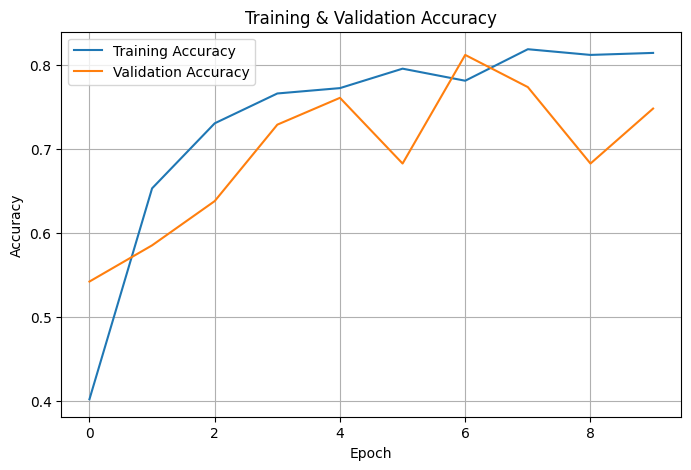

In [66]:
import matplotlib.pyplot as plt

# After training
history = model_fit.history

# Plot accuracy
plt.figure(figsize=(8, 5))
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Training & Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


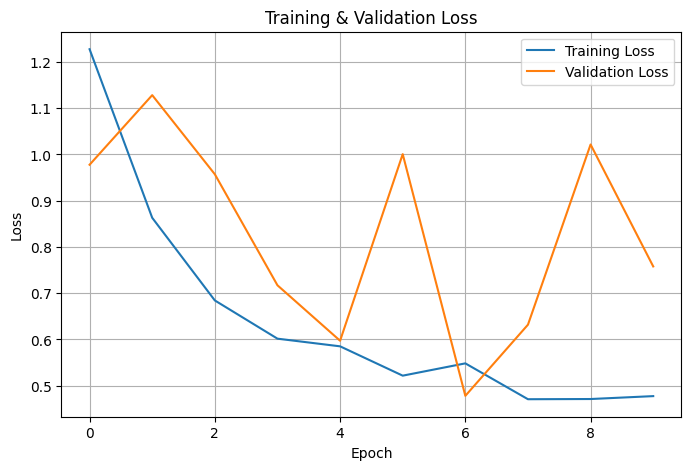

In [67]:
plt.figure(figsize=(8, 5))
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Training & Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [68]:
test_loss, test_accuracy = model.evaluate(test_ds)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 430ms/step - accuracy: 0.6953 - loss: 0.7939
Test Accuracy: 0.6952
Test Loss: 0.8603


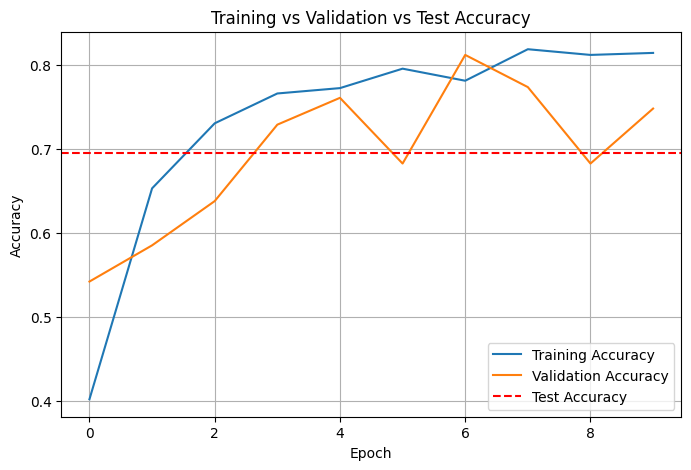

In [69]:
import matplotlib.pyplot as plt

history = model_fit.history
epochs = range(len(history['accuracy']))

plt.figure(figsize=(8, 5))
plt.plot(epochs, history['accuracy'], label='Training Accuracy')
plt.plot(epochs, history['val_accuracy'], label='Validation Accuracy')
plt.axhline(y=test_accuracy, color='r', linestyle='--', label='Test Accuracy')
plt.title('Training vs Validation vs Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


model is overfit let's add dropout and normalize the model using l1 or l2.

In [70]:
def arch_3(height=128, width=128):
    num_classes = 4
    hidden_size = 256

    model = keras.Sequential(
        name="model_cnn_3",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", input_shape=(height, width, 3),
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same",
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same",
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same",
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same",
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            # layers.MaxPooling2D(),
            # layers.Flatten(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size, kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.Dropout(0.5),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )
    return model

In [71]:
def compile_train_v2(model, train_ds, val_ds, epochs=10, ckpt_path="/tmp/checkpoint.weights.h5"):
    callbacks = [
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss", factor=0.3, patience=5, min_lr=0.00001
        ),
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', mode='max', save_best_only=True),
        keras.callbacks.EarlyStopping(
            monitor="val_loss", patience=10, min_delta=0.001, mode='min'
        )
    ]
    model.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])
    model_fit = model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=callbacks)
    return model_fit

In [72]:
model = arch_3()
model.summary()

Model: "model_cnn_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)               │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_11     │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 256)            │             

 Total params: 462,436 (1.76 MB)

 Trainable params: 460,932 (1.76 MB)

 Non-trainable params: 1,504 (5.88 KB)

In [73]:
model_fit = compile_train_v2(model, train_ds, val_ds, epochs=15)

Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.6268 - loss: 1.7650 - val_accuracy: 0.3461 - val_loss: 1.8837 - learning_rate: 0.0010
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - accuracy: 0.7660 - loss: 1.2702 - val_accuracy: 0.3748 - val_loss: 1.8375 - learning_rate: 0.0010
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - accuracy: 0.7955 - loss: 1.1116 - val_accuracy: 0.4498 - val_loss: 1.7923 - learning_rate: 0.0010
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 94s 2s/step - accuracy: 0.8259 - loss: 1.0276 - val_accuracy: 0.3589 - val_loss: 2.1044 - learning_rate: 0.0010
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - accuracy: 0.8038 - loss: 1.0801 - val_accuracy: 0.4737 - val_loss: 1.6370 - learning_rate: 0.0010
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - accuracy: 0.8193 - loss: 1.0085 - val_accuracy: 0.5837 - val_loss: 1.7352 - learning_rate: 0.0010
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - accuracy: 0.8535 - loss: 0.9482 - val_accurac

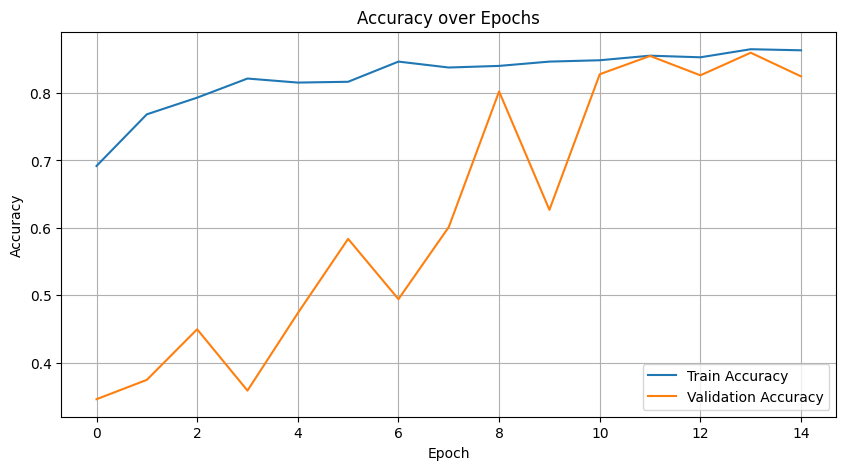

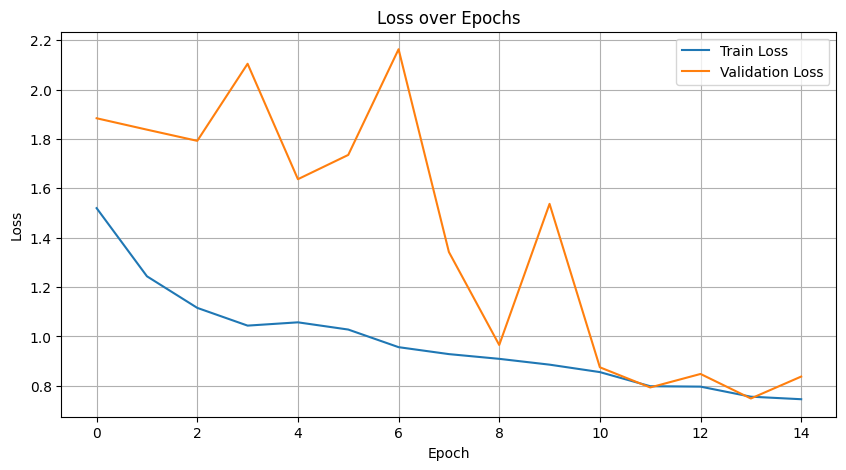

In [74]:
import matplotlib.pyplot as plt

history = model_fit.history

# Plot Accuracy
plt.figure(figsize=(10, 5))
plt.plot(history['accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot Loss
plt.figure(figsize=(10, 5))
plt.plot(history['loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [75]:
model.load_weights("/tmp/checkpoint.weights.h5")  # Load best model
test_loss, test_accuracy = model.evaluate(test_ds)


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 465ms/step - accuracy: 0.8022 - loss: 0.8329


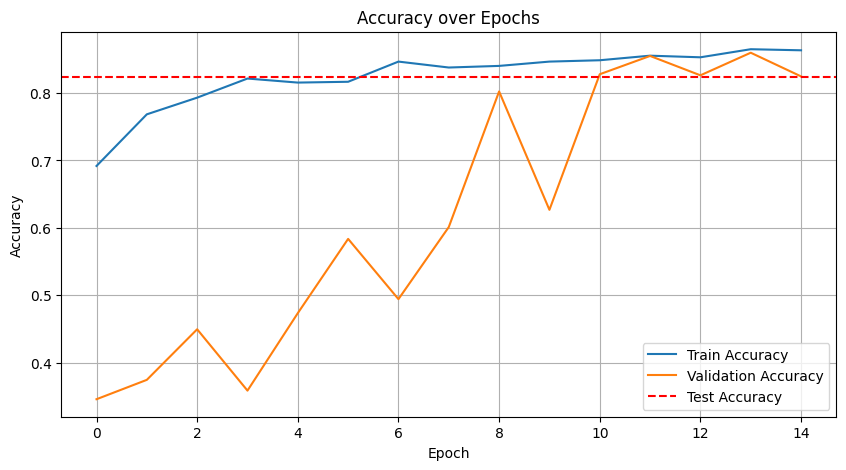

In [76]:
plt.figure(figsize=(10, 5))
plt.plot(history['accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.axhline(y=test_accuracy, color='red', linestyle='--', label='Test Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [77]:
def print_accuracy_stats(model, ds, class_names):
    model.load_weights("/tmp/checkpoint.weights.h5")
    true_onehot = tf.concat([y for x, y in ds], axis=0)
    true_categories = tf.argmax(true_onehot, axis=1)
    y_pred = model.predict(ds)
    predicted_categories = tf.argmax(y_pred, axis=1)

    test_acc = metrics.accuracy_score(true_categories, predicted_categories) * 100
    print(f'\nTest Accuracy: {test_acc:.2f}%\n')

# Note: This doesn't work with shuffled datasets
def plot_confusion_matrix(model, ds, class_names):
    model.load_weights("/tmp/checkpoint.weights.h5")
    true_onehot = tf.concat([y for x, y in ds], axis=0)
    true_categories = tf.argmax(true_onehot, axis=1)
    y_pred = model.predict(ds)
    predicted_categories = tf.argmax(y_pred, axis=1)
    cm = metrics.confusion_matrix(true_categories,predicted_categories) # last batch
    sns.heatmap(cm, annot=True, xticklabels=class_names, yticklabels=class_names, cmap="YlGnBu", fmt='g')
    plt.show()

6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 398ms/step

Test Accuracy: 82.34%

6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 620ms/step


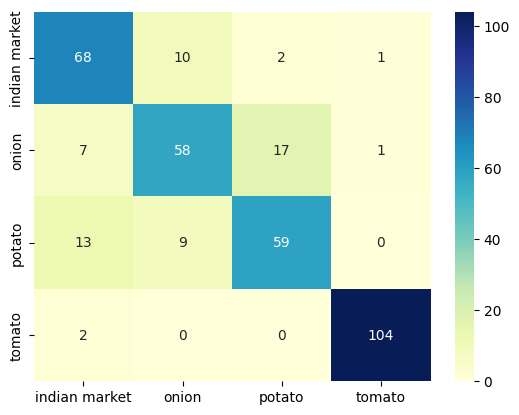

In [78]:
print_accuracy_stats(model, test_ds, class_names)
plot_confusion_matrix(model, test_ds, class_names)

Tomato class is perfectly predicted: 106 correct, 0 misclassified — 🔥

Indian Market is mostly correct (71/81), with some confusion with onion (9).

Onion and potato show the most confusion with each other:

Onion misclassified as potato (9)

Potato misclassified as onion (11)

we can use data augmentation for Potato and onion

training using vgg net

In [79]:

pretrained_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=[128,128, 3])

pretrained_model.trainable=False
vgg16_model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4, activation='softmax')
])



58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [80]:
vgg16_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 4)              │        32,772 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,747,460 (56.26 MB)

 Trainable params: 32,772 (128.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [81]:
import functools
top5_acc = functools.partial(tf.keras.metrics.SparseTopKCategoricalAccuracy())

vgg16_model.compile(
    optimizer='adam',
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
)

In [83]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)
history = vgg16_model.fit(
    train_ds,
    epochs=10,
    validation_data=val_ds,
    callbacks=[early_stop]
)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 578s 14s/step - accuracy: 0.6960 - loss: 0.7461 - val_accuracy: 0.7416 - val_loss: 0.6066
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 577s 14s/step - accuracy: 0.7786 - loss: 0.5167 - val_accuracy: 0.8182 - val_loss: 0.4143
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 581s 15s/step - accuracy: 0.8334 - loss: 0.4145 - val_accuracy: 0.8485 - val_loss: 0.3602
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 578s 14s/step - accuracy: 0.8587 - loss: 0.3798 - val_accuracy: 0.8453 - val_loss: 0.3912
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 544s 14s/step - accuracy: 0.8471 - loss: 0.3784 - val_accuracy: 0.8692 - val_loss: 0.3215
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 578s 14s/step - accuracy: 0.8528 - loss: 0.3771 - val_accuracy: 0.8724 - val_loss: 0.3147
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 578s 14s/step - accuracy: 0.8865 - loss: 0.3186 - val_accuracy: 0.8820 - val_loss: 0.3044
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 578s 14s/step - accuracy: 0.8748 - loss: 0.3309 - val_accuracy: 0.

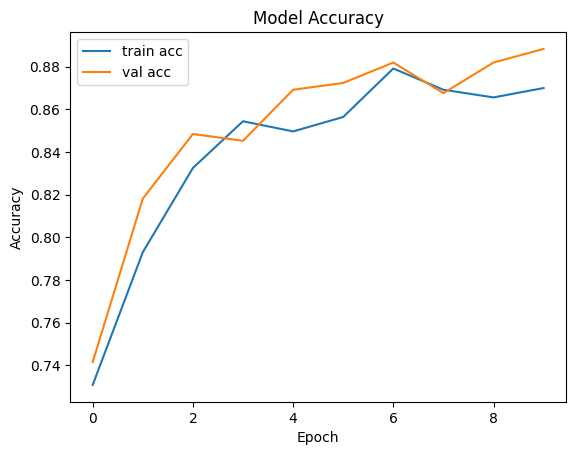

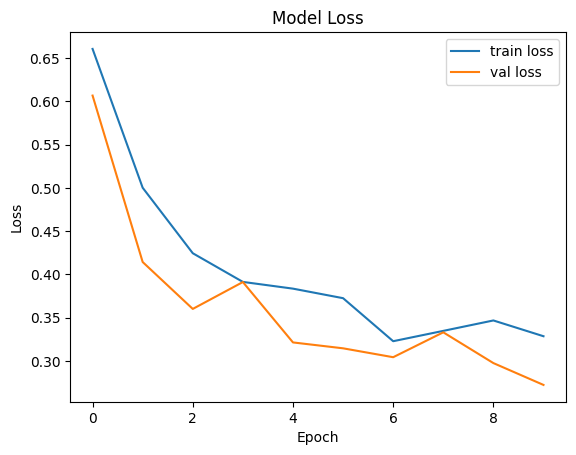

In [84]:
import matplotlib.pyplot as plt

# Accuracy
plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Loss
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


model is little overfitting.

In [85]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [86]:

pretrained_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=[128,128, 3])
# "Get the first few blocks of pretrained model and freeze them"
#1. break this pretrained model into two halves. first half is what you will freeze, 2nd half you will keep as it is
#2. sequential api (1st half, 2nd half, flatten, dense)
pretrained_model.trainable=False
vgg16_model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4, activation='softmax')
])


In [87]:
vgg16_model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 4)              │        32,772 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,747,460 (56.26 MB)

 Trainable params: 32,772 (128.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [88]:
import functools
top5_acc = functools.partial(tf.keras.metrics.SparseTopKCategoricalAccuracy())

vgg16_model.compile(
    optimizer='adam',
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
)

In [89]:
from tensorflow.keras.callbacks import EarlyStopping


early_stop = EarlyStopping(
    monitor='val_loss',
    patience=8,
    restore_best_weights=True
)


In [90]:


history = vgg16_model.fit(
    train_ds,
    epochs=15,
    validation_data=val_ds,
    callbacks=[early_stop]
)

Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 558s 14s/step - accuracy: 0.5568 - loss: 1.0321 - val_accuracy: 0.7640 - val_loss: 0.6133
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 558s 14s/step - accuracy: 0.7661 - loss: 0.5636 - val_accuracy: 0.8102 - val_loss: 0.4327
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 593s 15s/step - accuracy: 0.8007 - loss: 0.5088 - val_accuracy: 0.8373 - val_loss: 0.4031
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 589s 15s/step - accuracy: 0.8013 - loss: 0.4794 - val_accuracy: 0.8453 - val_loss: 0.3416
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 621s 15s/step - accuracy: 0.8257 - loss: 0.4461 - val_accuracy: 0.8565 - val_loss: 0.3578
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 587s 15s/step - accuracy: 0.8225 - loss: 0.4404 - val_accuracy: 0.8612 - val_loss: 0.3406
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 591s 15s/step - accuracy: 0.8436 - loss: 0.4214 - val_accuracy: 0.8724 - val_loss: 0.3374
Epoch 8/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 588s 15s/step - accuracy: 0.8475 - loss: 0.3898 - val_accuracy: 0.

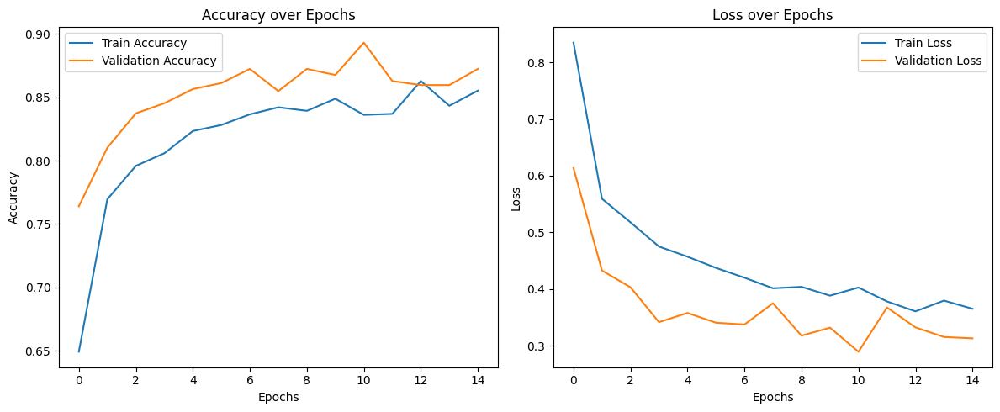

In [91]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.legend()

plt.tight_layout()
plt.show()


In [92]:
test_loss, test_accuracy = vgg16_model.evaluate(test_ds)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


6/6 ━━━━━━━━━━━━━━━━━━━━ 61s 10s/step - accuracy: 0.7952 - loss: 0.5513
Test Loss: 0.4698
Test Accuracy: 0.8348


2/2 ━━━━━━━━━━━━━━━━━━━━ 12s 6s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 5s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 5s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 6s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 10s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


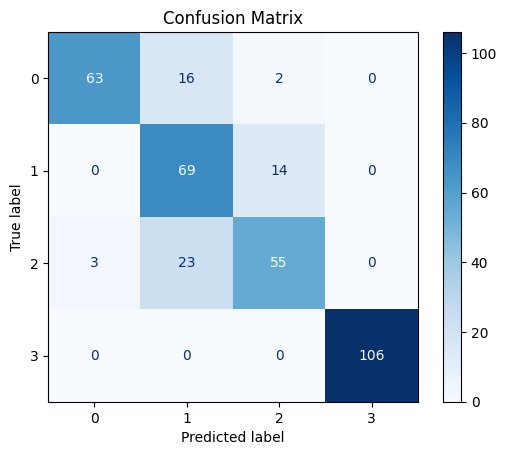

In [93]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

y_true = []
y_pred = []

for batch_images, batch_labels in test_ds:
    preds = vgg16_model.predict(batch_images)

    # Convert one-hot true labels to class indices
    y_true.extend(np.argmax(batch_labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

# Now plot confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()


Restnet model

In [55]:
def build_resnet_sequential_model():
    # Load base model
    base_model = tf.keras.applications.ResNet50(
        input_shape=(128, 128, 3),
        include_top=False,
        weights='imagenet'
    )
    base_model.trainable = False  # Freeze the base model

    model = tf.keras.Sequential([
        tf.keras.layers.Rescaling(1./255, input_shape=(128, 128, 3)),
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dropout(0.1),
        tf.keras.layers.Dense(4, activation='softmax')
    ])

    return model, base_model


In [56]:
# Build the model
model, base_model = build_resnet_sequential_model()

# Compile
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
    tf.keras.callbacks.ModelCheckpoint("resnet_sequential_best.keras", save_best_only=True),
    tf.keras.callbacks.TensorBoard(log_dir="logs/ResNetSequential", histogram_freq=1)
]

# Phase 1: Train only top layers
history = model.fit(train_ds, validation_data=val_ds, epochs=10, callbacks=callbacks)

# Phase 2: Fine-tuning (unfreeze last 30 layers of base model)
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Re-compile with lower LR
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune
fine_tune_history = model.fit(train_ds, validation_data=val_ds, epochs=10, callbacks=callbacks)


Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 199s 5s/step - accuracy: 0.2200 - loss: 1.4484 - val_accuracy: 0.2903 - val_loss: 1.4001
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 180s 4s/step - accuracy: 0.2519 - loss: 1.4163 - val_accuracy: 0.2903 - val_loss: 1.3840
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 190s 5s/step - accuracy: 0.2708 - loss: 1.3932 - val_accuracy: 0.2903 - val_loss: 1.3785
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 189s 5s/step - accuracy: 0.2764 - loss: 1.3856 - val_accuracy: 0.2903 - val_loss: 1.3763
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 187s 5s/step - accuracy: 0.2820 - loss: 1.3835 - val_accuracy: 0.2903 - val_loss: 1.3761
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 188s 5s/step - accuracy: 0.2799 - loss: 1.3851 - val_accuracy: 0.2903 - val_loss: 1.3761
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 187s 5s/step - accuracy: 0.2690 - loss: 1.3908 - val_accuracy: 0.2903 - val_loss: 1.3761
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 181s 4s/step - accuracy: 0.2874 - loss: 1.3832 - val_accuracy: 0.2903 - v

KeyboardInterrupt: 

this is taking too much time to train and model is not really learning anything. we will fix this if we have more compute power.

building mobilenet cnn model

In [94]:
def build_model():

    mobilenet_model = tf.keras.applications.MobileNetV2(
        weights ='imagenet',
        include_top = False,
        input_shape = (128,128,3)
    )



    for layer in mobilenet_model.layers[:-2]:
        layer.trainable = False


    x = mobilenet_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(128, activation = "relu")(x)
    output = tf.keras.layers.Dense(4, activation = 'softmax')(x)
    pretrained_model = tf.keras.Model(inputs = mobilenet_model.input, outputs = output)

    return pretrained_model

In [95]:
finetuned_mobilenet = build_model()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [96]:
finetuned_mobilenet.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_24      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 64, 64,    │        864 │ input_layer_24[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 64, 64,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 64, 64,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 64, 64,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 64, 64,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 64, 64,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 65, 65,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 32, 32,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 32, 32,    │      2,304 │ block_1_depthwis

 Total params: 2,422,468 (9.24 MB)

 Trainable params: 167,044 (652.52 KB)

 Non-trainable params: 2,255,424 (8.60 MB)

In [97]:
early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 8, restore_best_weights=True
)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("finetuned_mobilenet.keras", save_best_only=True)
log_dir_3 = "logs/mobilenet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_3, histogram_freq=1)


In [98]:
finetuned_mobilenet.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


In [99]:
history_1 = finetuned_mobilenet.fit(train_ds, validation_data = val_ds, epochs = 10, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 78s 2s/step - acc: 0.4221 - loss: 1.2876 - precision: 0.5178 - recall: 0.2286 - val_acc: 0.7065 - val_loss: 0.7318 - val_precision: 0.7847 - val_recall: 0.6045
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 78s 2s/step - acc: 0.7818 - loss: 0.6142 - precision: 0.8444 - recall: 0.6804 - val_acc: 0.7895 - val_loss: 0.5562 - val_precision: 0.8339 - val_recall: 0.7448
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - acc: 0.8152 - loss: 0.5096 - precision: 0.8498 - recall: 0.7548 - val_acc: 0.8373 - val_loss: 0.4434 - val_precision: 0.8559 - val_recall: 0.7959
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - acc: 0.8478 - loss: 0.4174 - precision: 0.8752 - recall: 0.8168 - val_acc: 0.8453 - val_loss: 0.4039 - val_precision: 0.8668 - val_recall: 0.8198
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step - acc: 0.8621 - loss: 0.3888 - precision: 0.8840 - recall: 0.8339 - val_acc: 0.8772 - val_loss: 0.3290 - val_precision: 0.8913 - val_recall: 0.8501
Epoch 6/10

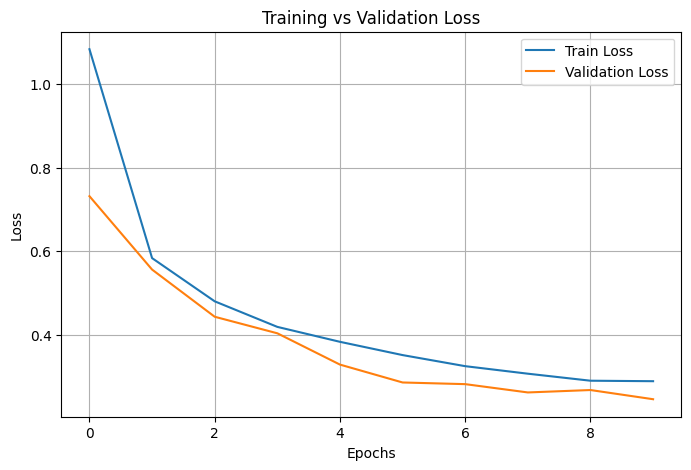

In [100]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(history_1.history['loss'], label='Train Loss')
plt.plot(history_1.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


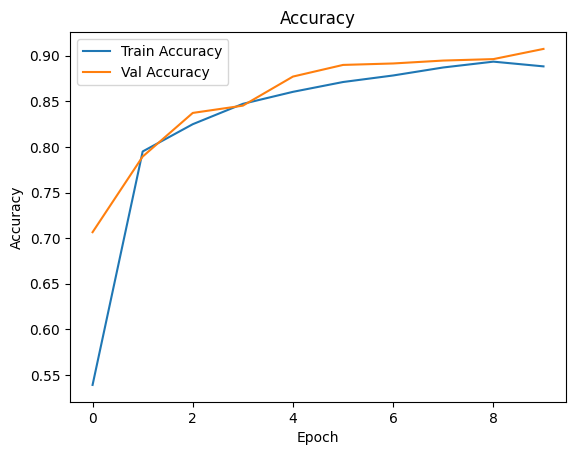

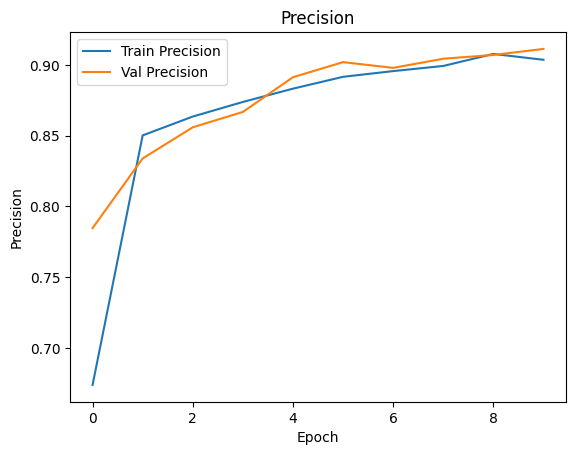

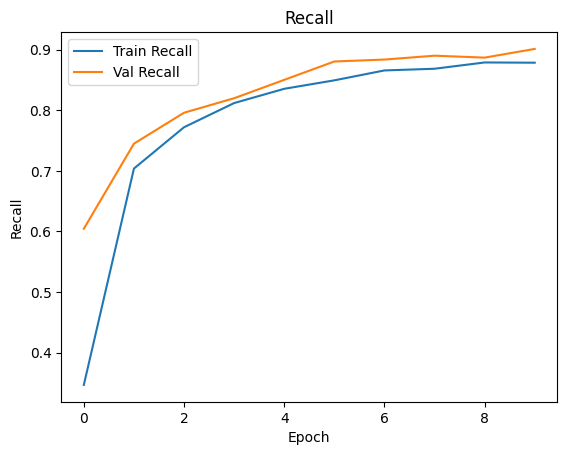

In [101]:
# Accuracy
plt.plot(history_1.history['acc'], label='Train Accuracy')
plt.plot(history_1.history['val_acc'], label='Val Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Precision
plt.plot(history_1.history['precision'], label='Train Precision')
plt.plot(history_1.history['val_precision'], label='Val Precision')
plt.title('Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend()
plt.show()

# Recall
plt.plot(history_1.history['recall'], label='Train Recall')
plt.plot(history_1.history['val_recall'], label='Val Recall')
plt.title('Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()
plt.show()


In [102]:

y_pred = []
y_true = []

for images, labels in test_ds:
    preds = finetuned_mobilenet.predict(images)
    y_pred.extend(tf.argmax(preds, axis=1).numpy())
    y_true.extend(tf.argmax(labels, axis=1).numpy())


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 341ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 340ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 312ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


In [103]:
test_loss, test_acc, test_precision, test_recall = finetuned_mobilenet.evaluate(test_ds)
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 665ms/step - acc: 0.8431 - loss: 0.4462 - precision: 0.8466 - recall: 0.8354
Test Accuracy: 0.8917
Test Precision: 0.8937
Test Recall: 0.8860


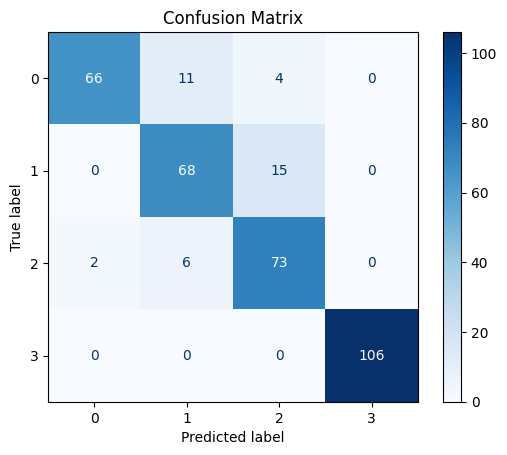


Classification Report:

              precision    recall  f1-score   support

           0       0.97      0.81      0.89        81
           1       0.80      0.82      0.81        83
           2       0.79      0.90      0.84        81
           3       1.00      1.00      1.00       106

    accuracy                           0.89       351
   macro avg       0.89      0.88      0.88       351
weighted avg       0.90      0.89      0.89       351



In [104]:
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

print("\nClassification Report:\n")
print(classification_report(y_true, y_pred))


In [105]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [124]:
import matplotlib.pyplot as plt
import tensorflow as tf
import random

def grid_test_model(model, test_ds, class_names):
    """
    Visualizes model predictions on 8 random test images.

    Parameters:
    - model: trained keras model
    - test_ds: tf.data.Dataset (with images and labels)
    - class_names: list of class labels
    """
    fig = plt.figure(figsize=(17, 11))
    plt.axis('off')

    # Unbatch and take 100 random samples to choose from
    test_samples = list(test_ds.unbatch().take(100))

    for i in range(8):
        # Random image and label from test samples
        img, label = random.choice(test_samples)

        # Resize if needed by model
        img_resized = tf.image.resize(img, (128, 128))
        img_input = tf.expand_dims(img_resized, axis=0)

        # Predict
        pred = model.predict(img_input)
        predicted_label = tf.argmax(pred[0]).numpy()
        percentages = tf.round(pred[0] * 100).numpy().astype(int)

        # Prepare image for plotting (normalize only if needed)
        img_np = img.numpy()
        if img_np.max() > 1.0:
            img_np = img_np / 255.0

        # Plot
        plt.subplot(2, 4, i + 1)
        plt.axis('off')
        plt.imshow(img_np)
        plt.title(
            f'Prediction: {class_names[predicted_label]}\n\n'
            f'{percentages[0]}% {class_names[0]}\n'
            f'{percentages[1]}% {class_names[1]}\n'
            f'{percentages[2]}% {class_names[2]}\n'
            f'{percentages[3]}% {class_names[3]}',
            fontsize=10
        )

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


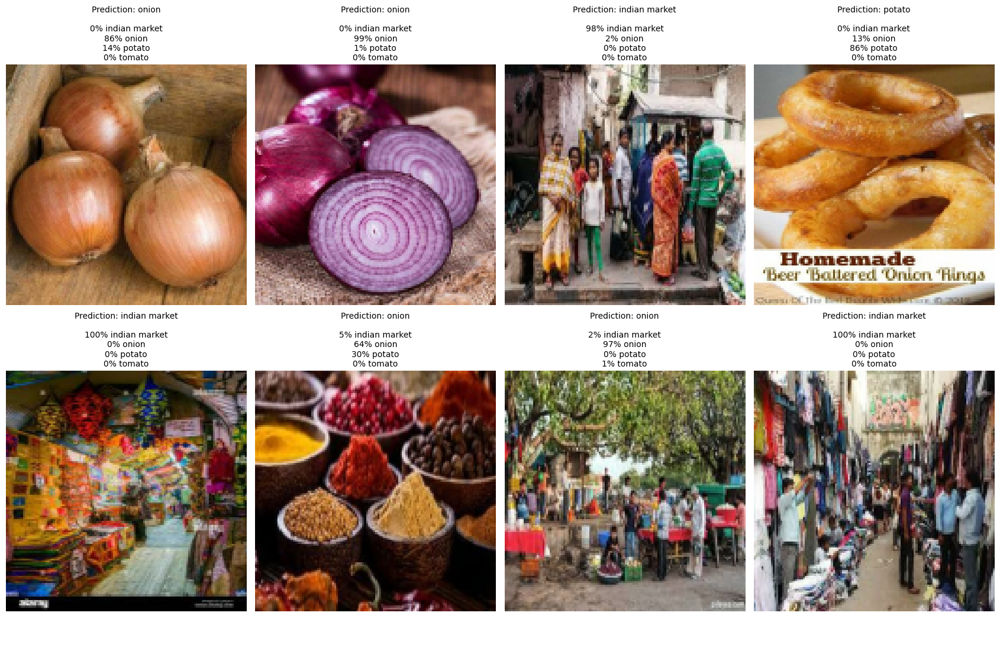

In [125]:
grid_test_model(finetuned_mobilenet, test_ds, class_names)


The dataset was moderately balanced with each class (onion, potato, tomato, market scenes) having comparable image counts, though Indian market images were slightly fewer.

Initial CNN models showed signs of overfitting, where training accuracy was high but validation accuracy lagged behind.

Applying Dropout and BatchNormalization, along with EarlyStopping and ModelCheckpoint, helped mitigate overfitting and improved generalization.

he final testing accuracy was strong across all classes, with high precision in classifying tomatoes, potatoes, and onions.

Some confusion occurred between market images and vegetable images—a likely issue due to background noise or vegetables appearing in market scenes.

The confusion matrix provided useful insights into these misclassifications and highlighted potential for additional noise filtering or bounding-box localization in future work.